Matheus do Ó Santos Tiburcio

#Equação de Duffing:

A equação de Duffing, ou oscilador de Duffing, é dada por:

#$\frac{d^{2}x}{dt^{2}} + δ\frac{dx}{dt} + αx + βx^{3} = γcos(ωt)$, onde:

$δ$: atrito interno (efeito de dissipação de energia em um sistema oscilatório)<br>
$α$: rigidez (resistência do material à deformação)<br>
$β$: a "quantidade" de não linearidade na força restauradora<br>
$γ$: a amplitude da força motriz periódica<br>
$ω$: a frenquência da força motriz periódica<br>

É, portanto, uma equação diferencial de 2º ordem e foi descrita por Georg Duffing, um engenheiro e inventor alemão, em 1918.

Essa equação descreve um sistema dinâmico, ou seja, dado estado dentro do mesmo depende de estados anteriores.

Ele procura modelar osciladores harmônicos, então acaba por ser muito útil na modelagem de sistemas periódicos.

---

#Métodos de solução

Dependendo da natureza do problema que esteja se lidando ao usar a equação de Duffing, diferentes métodos podem ser utilizados para resolver a equação.

O métodos de Euler e Runge-Kutta são uma possibilidade de resolução. Pode-se também expandí-la em uma série de Fourier ou mesmo utilizar o método de Frobenius. Estes dois últimos não utilizarei.

Um método válido de mencionar também é o que utiliza funções elípticas de Jacobi, uma possibilidade caso $δ$ = 0 e $γ$ = 0.

---

Para trabalhar com ela, tratei como uma equação diferencial de 1° ordem fazendo as seguintes mudanças de variável:

##$v = \frac{dx}{dt}$<br/>
##$v' = γcos(ωt) - δv - αx - βx^{3}$


In [ ]:
import math
import numpy as np
from scipy.integrate import odeint
import matplotlib.pyplot as plt
import imageio
from PIL import Image

from matplotlib.animation import FuncAnimation
import matplotlib.animation as anim
from IPython import display

In [ ]:
d0 = 0.02
a0 = -1
b0 = 0.03
g0 = 3
o0 = 1


fx0 = 4
pi2 = 2*np.pi
v0 = 1

def duffing(pos, t, delta = d0, alpha = a0, beta = b0, gamma = g0, omega = o0):
  x = pos[0]
  v = pos[1]
  dv = (gamma * math.cos(omega*t)) - (delta * v) - (alpha * x) - (beta * x**3)
  dpos = [v, dv]

  #print(dv)
  return dpos

def plota(ax, Dados, ponto = 0, s = 1):
  if(not(ponto)):
    ax.plot(Dados[:, 0], Dados[:, 1], linewidth=1, color="black")
  else:
    x = list(Dados[:, 0])
    y = list(Dados[:, 1])
    ax.scatter(x, y, linewidth=1, s = s, color="black")

def plota3d(ax, Dados, ponto = 0):
  #s = o0
  if(not(ponto)):
    ax.plot(Dados[:, 0], Dados[:, 1], Dados[:, 2], linewidth=1, color="black")
  else:
    ax.scatter(Dados[:, 0], Dados[:, 1], Dados[:, 2], linewidth=0.01, color="black")

def anima(i):
  global fotos
  plt.imshow(fotos[i])

#Geração de dados

Aqui gero alguns dados a partir de uma condição inicial. Esses dados são a evolução no tempo da partícula. As grandezas seriam posição e velocidade.

In [ ]:
def geraDados(pos, t, delta = d0, alpha = a0, beta = b0, gamma = g0, omega = o0):
  Dados = odeint(duffing, x0, t, rtol=10**(-12),\
                 atol=10**(-12)*np.ones_like(x0),\
                 args=(delta, alpha, beta, gamma, omega))
  return Dados

#Análise dos parâmetros:

Aqui me baseei na discussão da wikipedia sobre a influência da ausência de alguns parâmetros.

##i) $δ = 0$ e $γ = 0$ -> sistema harmônico não amortecido e sem força motriz

Antes acredito que seja interessante discutir o que seria um sistema harmônico amortecido:

Um sistema harmônico amortecido é um sistema harmônico onde forças externas fazem com que a energia do sistema se dissipe com o tempo.

Portanto, um sistema não-amortecido não apresentaria tal característica. Seria um sistema conservativo e analisando $δ$ é possível entender o porquê disto. $δ$ é diretamente ligado ao atrito interno do sistema, tendo-o igual a zero entrega um sistema sem efeitos de dissipação de energia.

Já γ se refere à amplitude da força motriz, zerar a amplitude é ter um sistema sem força motriz.

##ii) $β = 0$

$β$ está diretamente ligado ao comportamento da força restauradora, quanto maior ou mais influente essa força, mais haverá a tendência de o objeto no modelo retornar à um ponto de equilibrio. Pelo o que compreendi, com $β$ zerado não haverá força restauradora e portanto o objeto não retornará à uma posição de equilibrio. O gráfico disso ilustrava uma espiral (quando $α > 0$).

Abaixo plotei os gráficos de análise de $γ$, $δ$ e $β$.


#Análise de Gamma

In [ ]:
from matplotlib import animation, rc
from IPython.display import HTML

delta = d0
alpha = a0
beta = b0
gamma = g0
omega = o0

x0 = [1, 2] #condição inicial
dt = 0.01
ciclos = 50
t = np.arange(0, ciclos*pi2, dt)

gammas = np.linspace(1, 0, 30)

def anima(i):
  ax.clear()
  g = gammas[i]

  titulo = f"δ = {delta}, α = {alpha}, β = {beta}, \
  γ ≈ {round(g, 5)}, ω = {omega}, dt = {dt}, tmax = {2*ciclos}π"

  ax.set_title(titulo)
  ax.set_xlabel("x")
  ax.set_ylabel("v")
  Dados = geraDados(x0, t, delta, alpha, beta, g, omega)
  ax.plot(Dados[:, 0], Dados[:, 1], linewidth=0.5, color="black")

#plt.show()

fig = plt.figure()
ax = fig.add_subplot()

animacao = FuncAnimation(fig, anima, frames=len(gammas), interval=300, repeat_delay=2000)
#anim = animation.FuncAnimation(fig, animate, init_func=init, frames=range(0,np+1,20),
#                               interval=200, repeat_delay=500, blit=True)
rc('animation', html='jshtml')
plt.close()
animacao

#Análise de delta

In [ ]:
from matplotlib import animation, rc
from IPython.display import HTML

delta = d0
alpha = a0
beta = b0
gamma = g0
omega = o0

x0 = [1, 2] #condição inicial
dt = 0.01
ciclos = 50
t = np.arange(0, ciclos*pi2, dt)

deltas = np.linspace(1, 0, 30)

def anima(i):
  ax.clear()
  d = deltas[i]

  titulo = f"δ ≈ {round(d, 5)}, α = {alpha}, β = {beta}, \
  γ = {gamma}, ω = {omega}, dt = {dt}, tmax = {2*ciclos}π"

  ax.set_title(titulo)
  ax.set_xlabel("x")
  ax.set_ylabel("v")
  Dados = geraDados(x0, t, d, alpha, beta, gamma, omega)
  ax.plot(Dados[:, 0], Dados[:, 1], linewidth=0.5, color="black")

#plt.show()

fig = plt.figure()
ax = fig.add_subplot()

animacao = FuncAnimation(fig, anima, frames=len(deltas), interval=150, repeat_delay=2000)
#anim = animation.FuncAnimation(fig, animate, init_func=init, frames=range(0,np+1,20),
#                               interval=200, repeat_delay=500, blit=True)
rc('animation', html='jshtml')
plt.close()
animacao

Text(0.5, 1.0, 'pondo β = 0')

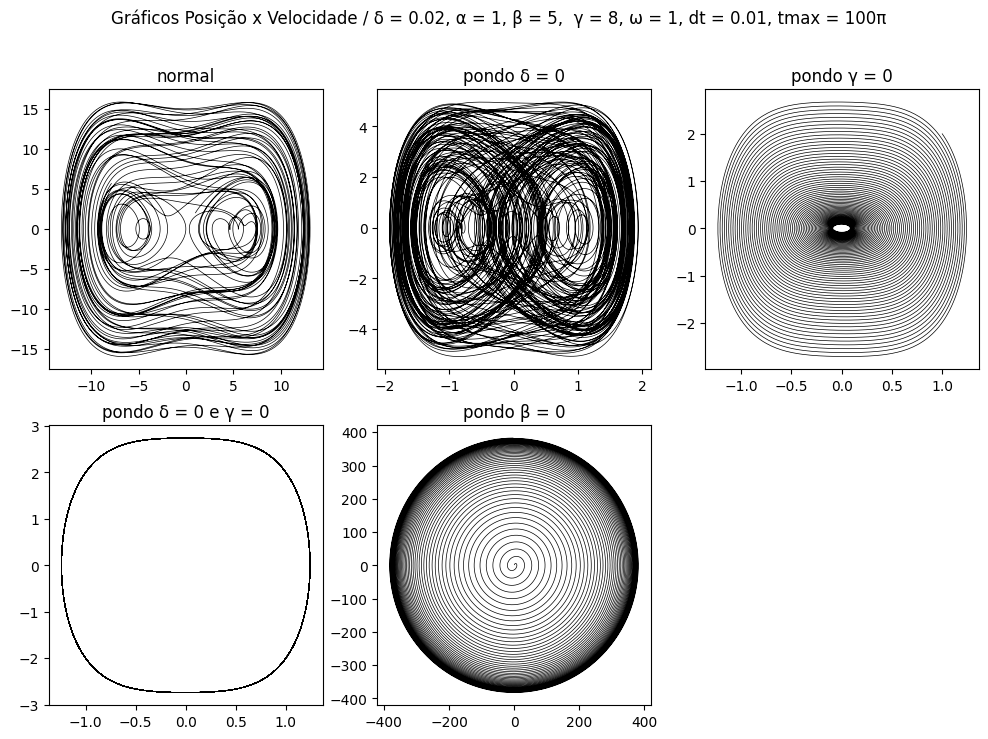

In [ ]:
delta = 0.02
alpha = 1
beta = 5
gamma = 8
omega = 1

mosaico = """
          abc
          de.
          """

fig = plt.figure(figsize=(12, 8))
ax = fig.subplot_mosaic(mosaico)
fig.suptitle(f"Gráficos Posição x Velocidade / δ = {delta}, α = {alpha}, β = {beta},\
  γ = {gamma}, ω = {omega}, dt = {dt}, tmax = {2*ciclos}π")

Dados = geraDados(x0, t, delta, alpha, beta, 0, omega)

titulo = "pondo γ = 0"
ax['c'].plot(Dados[:, 0], Dados[:, 1], linewidth=0.5, color="black")
ax['c'].set_title(titulo)

Dados = geraDados(x0, t, 0, alpha, beta, gamma, omega)

titulo = "pondo δ = 0"
ax['b'].plot(Dados[:, 0], Dados[:, 1], linewidth=0.5, color="black")
ax['b'].set_title(titulo)


Dados = geraDados(x0, t)

titulo = "normal"
ax['a'].plot(Dados[:, 0], Dados[:, 1], linewidth=0.5, color="black")
ax['a'].set_title(titulo)

Dados = geraDados(x0, t, 0, alpha, beta, 0, omega)

titulo = "pondo δ = 0 e γ = 0"
ax['d'].plot(Dados[:, 0], Dados[:, 1], linewidth=0.5, color="black")
ax['d'].set_title(titulo)


Dados = geraDados(x0, t, delta, alpha, 0, gamma, omega)

titulo = "pondo β = 0"
ax['e'].plot(Dados[:, 0], Dados[:, 1], linewidth=0.5, color="black")
ax['e'].set_title(titulo)

---

#Pontos de equilíbrio

Os pontos de equilíbrio estáveis e instáveis estão em $αx + βx^{3} = 0$ [4]. Analisando dois casos temos que:

Se $α > 0$ x = 0 será um ponto de equilibrio estável.

Caso adicional a isso $α < 0$ haverão dois pontos estáveis sendo:

##$x_{1} = \sqrt{\frac{-α}{β}}, x_{2} = -\sqrt{\frac{-α}{β}}$

Como já apareceu anteriormente nos dois últimos plots, no primeiro é posto $α$ e $β > 0$ e isso resulta em um equilibrio em $(0, 0)$. No segundo $α < 0$, resultando em dois pontos de equilibrio em $(x_{1}, 0)$ e $(x_{2}, 0)$.

Abaixo haverá um exemplo com:
$δ = 0.01$,
$α = -1$,
$β = -0.01$,
$γ = 1$,
$ω = 1$

Portanto:

$x_{1} = \sqrt{\frac{-(-1)}{0.01}} = -\sqrt{100} = -10$<br/>
$x_{2} = -\sqrt{\frac{-(-1)}{0.01}} = \sqrt{100} = 10$

E outro com $α = 1$.

Text(0, 0.5, 'v')

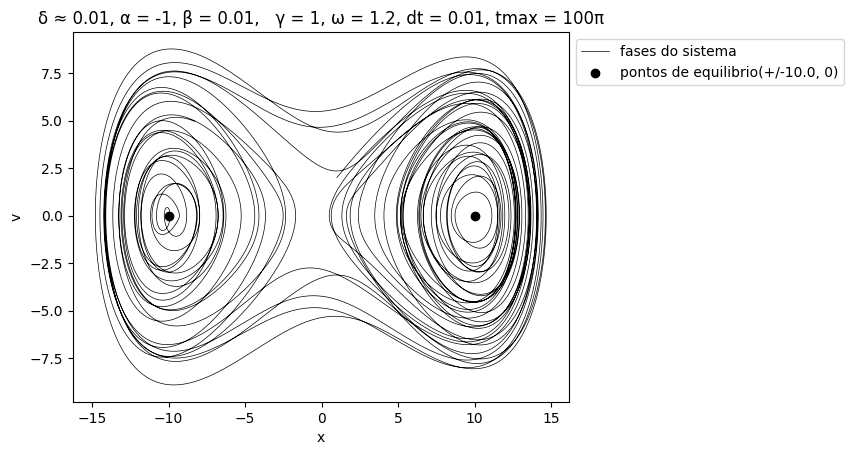

In [ ]:
delta = 0.01
alpha = -1
beta = 0.01
gamma = 1
omega = 1.2

x0 = [1, 2] #condição inicial
dt = 0.01
ciclos = 50
t = np.arange(0, ciclos*pi2, dt)


Dados = geraDados(x0, t, delta, alpha, beta, gamma, omega)

xEq = np.sqrt(-alpha/beta)

plt.plot(Dados[:, 0], Dados[:, 1], linewidth=0.5, color="black")
plt.scatter([xEq, -xEq], [0, 0], color = "black")
titulo = f"δ ≈ {delta}, α = {alpha}, β = {beta}, \
  γ = {gamma}, ω = {omega}, dt = {dt}, tmax = {2*ciclos}π"
plt.title(titulo)
plt.legend(["fases do sistema", f"pontos de equilibrio(+/-{xEq}, {0})", ""], bbox_to_anchor = (1, 1))
plt.xlabel("x")
plt.ylabel("v")

Text(0, 0.5, 'v')

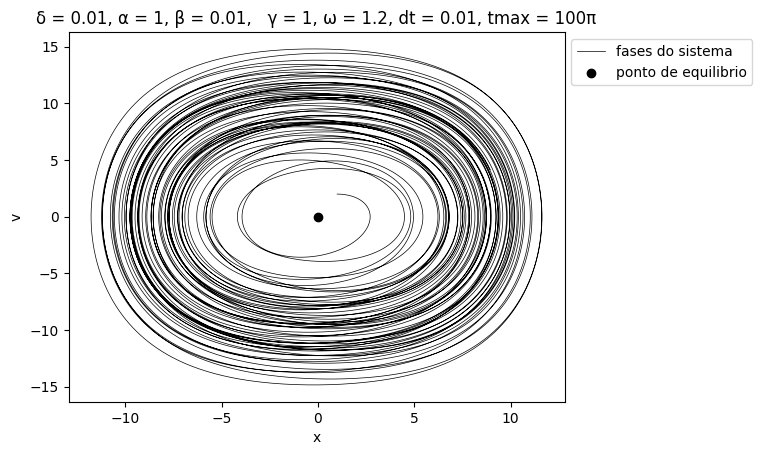

In [ ]:
delta = 0.01
alpha = 1
beta = 0.01
gamma = 1
omega = 1.2
Dados = geraDados(x0, t, delta, alpha, beta, gamma, omega)

plt.plot(Dados[:, 0], Dados[:, 1], linewidth=0.5, color="black")
plt.scatter(0, 0, color = "black")
titulo = f"δ = {delta}, α = {alpha}, β = {beta}, \
  γ = {gamma}, ω = {omega}, dt = {dt}, tmax = {2*ciclos}π"
plt.title(titulo)
plt.legend(["fases do sistema", "ponto de equilibrio", ""], bbox_to_anchor = (1, 1))
plt.xlabel("x")
plt.ylabel("v")

---

#Outros modos de representação

Até agora os plots representavam um gráfico de fases do sistema com $x$ no eixo de $x$ e $x'$ no eixo $y$. Sendo $x$ e $x'$ posição e velocidade respectivamente.

Porém há outras formas de enxergar esse sistema. Ponho aqui uma que mede a posição ao decorrer do tempo. Nesse caso será tempo ($t$) e posição ($x$) no eixo $x$ e $y$ respectivamente. Após isso, mostro uma tentativa de criar uma secção de Poincaré. Essa retrata as fases do sistema em intervalos igualmente espaçados.

Text(0, 0.5, 'x')

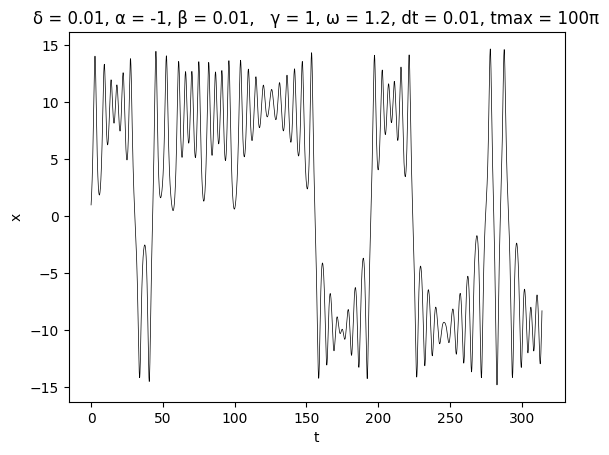

In [ ]:
delta = 0.01
alpha = -1
beta = 0.01
gamma = 1
omega = 1.2

t = np.arange(0, ciclos*pi2, dt)
Dados = geraDados(x0, t, delta, alpha, beta, gamma, omega)

plt.plot(t, Dados[:, 0], linewidth=0.5, color="black")
titulo = f"δ = {delta}, α = {alpha}, β = {beta}, \
  γ = {gamma}, ω = {omega}, dt = {dt}, tmax = {2*ciclos}π"
plt.title(titulo)
#plt.legend()
plt.xlabel("t")
plt.ylabel("x")

In [ ]:
delta = 0.01
alpha = -1
beta = 0.01
gamma = 1
omega = 1.2

x0 = [1, -1] #condição inicial
dt = 0.1
ciclos = 50
tempoPorAnalise = 50
quebra = 10
t = np.arange(0, ciclos*pi2, (ciclos*pi2)/(100*quebra*tempoPorAnalise))
print(f"{(ciclos*pi2)/(quebra*tempoPorAnalise)}, {len(t)}")

def anima(i):
  ax.clear()
  titulo = f"δ = {delta}, α = {alpha}, β = {beta}, γ = {gamma}, ω = {omega}, recorte {i}"
  ax.set_title(titulo)
  ax.set_xlabel("x")
  ax.set_ylabel("v")
  Dados = geraDados(x0, t[i :: tempoPorAnalise], delta, alpha, beta, gamma, omega)
  #print(Dados)
  ax.scatter(Dados[:, 0], Dados[:, 1], linewidth=0.5, color="black", s = 0.5)

#plt.show()

fig = plt.figure()
ax = fig.add_subplot()

animacao = FuncAnimation(fig, anima, frames=tempoPorAnalise+1, interval=300, repeat_delay=2000)
#anim = animation.FuncAnimation(fig, animate, init_func=init, frames=range(0,np+1,20),
#                               interval=200, repeat_delay=500, blit=True)
rc('animation', html='jshtml')
plt.close()
animacao

0.6283185307179586, 50000


---

#Uso de DMD

In [ ]:
#Acha U, S e V de uma matriz A
def achaUSV(A):
  return np.linalg.svd(A, full_matrices=0)

#resolve SVD para k colunas
def SVDK(U, S, V, k):
  svdK = np.dot(U[:, :k], np.dot(np.diag(S[:k]), V[:k, :]))
  return svdK

#calcula pseudo-inversa
def pseudoInversa(X):
  U, S, V = achaUSV(X)
  Sinv = np.linalg.pinv(np.diag(S))
  Xplus = V.T @ Sinv @ U.T

  return Xplus

#Encontra uma matriz Xr com rank r que satisfaça erroRelativo <= L,
#onde L é passado para a função
def determinaXr(L, X):
  rMax = 0
  Xnorm = np.linalg.norm(X)
  r = 0
  i = 2

  U, S, V = achaUSV(X)
  Xr = np.zeros((X.shape[0], X.shape[1]))

  if(Xp.shape[0] <= Xp.shape[1]):
    rMax = Xp.shape[0]
  else:
    rMax = Xp.shape[1]

  for i in range(1, rMax+1):
    Xr = SVDK(U, S, V, i)
    normr = (Xnorm - np.linalg.norm(Xr))/Xnorm
    if(normr <= L):
      r = i
      break

  return r, Xr

In [ ]:
x0 = [0, 0] #condição inicial
dt = 0.01
ciclos = 50
t = np.arange(0, ciclos*pi2, dt)

Dados = geraDados(x0, t)
X = Dados.T[:, :-1]
Xp = Dados.T[:, 1:]

##* Usarei explicações e códigos de trabalhos semanais meus anteriores. Em específico os que fiz relacionados ao próprio DMD. Como havia feito uma explicação teórica sobre e tentado implementar, acho que encaixa bem em utilizá-los aqui.

#Linearização via DMD

Esse sistema não necessariamente é linear. Portanto pode ser de interesse tentar linearizá-lo. Há jeitos e jeitos de se fazer isso e o que utilizarei será o DMD (Dynamic Mode Decomposition). Ele costuma ser utilizado em modelos dinâmicos periódicos, que é o caso da equação de Duffing.

Quero então uma matriz $A$ tal que:

$AX = X'$

##Falta descrever as matrizes:

###Matrix X

Essa será minha matriz de dados. Nesse exemplo, suas linhas representação a localização espacial do ponto (posição x velocidade) e as colunas representam o tempo. Nesse caso haverá $x_{0}$ na primeira coluna, $x_{1}$ na segunda, representando a localização no ponto no instante de tempo $t_{1}$. Resumidamente:

Linhas de X -> Provê uma análise espacial (1)<br/>
Colunas de X -> Provê uma análisa temporal (2)

Ressalto que X não contém todos os instantes t. Na verdade, contém os intantes de $t_{0}$ até $t_{n-1}$, onde n+1 é o número de instantes de t avaliados. Isso será melhor explicado abaixo.

###Matrix X'

Essa matriz diz "para onde foi" o nosso ponto na transição de um t a outro. Por esse motivo, X' contém os instantes de $t_{1}$ até $t_{n}$.

Ou seja, a coluna i de X onde o ponto x estava em $t_{i}$ e a coluna i de X' nos diz para onde ele foi. A análise temporal e espacial discutida em (1) e (2) se aplica igualmente aqui.

Resumidamente, a matriz X' é a matriz X deslocada uma coluna para a esquerda.

---

Farei a linearização usando a ideia de pseudo-inversa. Denotarei a pseudo-inversa de X por $X^{+}$. Multiplicando por $X^{+}$ em ambos os lados em  (3):

$A = X'X^{+}$

Irei descrever a pseudo-inversa como a seguinte composição de matrizes: $(M^{T}M)^{-1}M^{T}$, para alguma matriz $M$. Usando SVD sabe-se que:

$X = UΣV^{T}$, onde $U$ e $V$ são matrizes ortonormais e sigma uma matriz diagonal. Por $U$ e $V$ serem ortogonais segue que $U^{-1} = U^{T}$, o mesmo raciocínio vale para $V$. Para Σ temos $Σ^{T} = Σ$, pois Σ é diagonal e, portanto, simétrica nesse caso. Logo:

$X^{T} = VΣ^{T}U^{T}$

$X^{T}X = VΣ^{T}U^{T}UΣV^{T} = VΣ^{T}ΣV^{T}$

$(X^{T}X)^{-1} = VΣ^{-1}(Σ^{T})^{-1}V^{T}$

$(X^{T}X)^{-1}X^{T} = VΣ^{-1}(Σ^{T})^{-1}V^{T}VΣ^{T}U^{T}$

$(X^{T}X)^{-1}X^{T} = VΣ^{-1}Σ^{-1}V^{T}VΣU^{T}$

$(X^{T}X)^{-1}X^{T} = VΣ^{-1}U^{T} = X^{+}$

Com essa relação final posso calcular $X^{+}$ e achar a aproximação linear de $A$. Contudo, como estou usando SVD, posso também reduzir a dimensão de X para facilitar os cálculos. Assim terei uma matriz A também reduzida, que denotarei por $Â$.

$Â ≈ A$

Â é denotada por A no código.

---

O DMD auxilia nesse processo de linearização porque não me obriga a calcular a matriz A diretamente, que em certas ocasiões pode ser bem grande. Há a matriz $Φ$ representando os autovetores de A:

$Φ = X'VΣ^{-}W$, $W$ sendo os autovetores de $A$ usando $X$ reduzido pelo SVD.

O método para definir uma boa aproximação em que utilizei para a matriz $X$ usando SVD é o de comparação de um limite L com o erro relativo de $X$ e sua aproximação:

###$L ≥ |\frac{||X|| - ||X_{r}||}{||X||}|$, onde:

$||X||$ é a norma da matriz de dados original

$||X_{r}||$ é a norma da matriz com dimensão reduzida com $r$ pivôs.

In [ ]:
L = 0.1
r, Xr = determinaXr(L, X) #Acha X reduzido
#A = Xp @ pseudoInversa(Xr) #calcula A = X'Xr+
Ur, Sr, Vr = achaUSV(Xr) #Faz SVD em X reduzido
Sr = np.diag(Sr)
Atil = Ur.T @ Xp @ Vr.T @ np.linalg.inv(Sr) #Calcula Ã como (U.T)A(U)
autovalores, W = np.linalg.eig(Atil)

Phi = Xp @ Vr.T @ np.linalg.inv(Sr) @ W
Phi

array([[0.02310281-0.68040193j, 0.02310281+0.68040193j],
       [0.7320377 +0.02513906j, 0.7320377 -0.02513906j]])

Finalmente, A será então:

$A = ΦΛΦ^{+}$

In [ ]:
A1 = Phi @ np.diag(autovalores) @ np.linalg.pinv(Phi)
A1

array([[ 0.99994212+6.16513330e-17j,  0.00999985+2.51123470e-16j],
       [-0.01157552-2.66142846e-16j,  0.99993381+9.06628861e-17j]])

#Implementei usando minha implementação e a mostrada em aula usando a função CamR. Parece dar algo semelhante, CamR parece retornar a mesma A que a minha, porém transposta. Uma parte dos dados ganhou uma parte imaginária, deixando um pouco difícil analisar os gráficos. O resultado do plot ficou uma reta constante.

In [ ]:
#Função de uma das práticas anteriores
def CamR(X, Xp, r):
    #SVD
    U, Sigma, VT = np.linalg.svd(X, full_matrices=0)  # Paso 1
    #reducao de dimensao
    Ur = U[:, :r]
    Sigmar = np.diag(Sigma[:r])
    VTr = VT[:r, :]
    Atilde = np.linalg.solve(Sigmar.T, (Ur.T @ Xp @ VTr.T).T).T  # Step 2
    return Sigma, Atilde

sigma, A2 = CamR(X, Xp, r)

In [ ]:
A = A1
print(f"{A1.T.real}\n")
print(A2)

[[ 0.99994212 -0.01157552]
 [ 0.00999985  0.99993381]]

[[ 0.99989388 -0.0115743 ]
 [ 0.01000107  0.99998205]]


/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
<ipython-input-170-049ff04f17ac>:15: RuntimeWarning: overflow encountered in double_scalars
  dv = (gamma * math.cos(omega*t)) - (delta * v) - (alpha * x) - (beta * x**3)
<ipython-input-170-049ff04f17ac>:15: RuntimeWarning: invalid value encountered in double_scalars
  dv = (gamma * math.cos(omega*t)) - (delta * v) - (alpha * x) - (beta * x**3)
/usr/local/lib/python3.10/dist-packages/scipy/integrate/_odepack_py.py:248: ODEintWarning: Excess accuracy requested (tolerances too small). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


Text(0.5, 1.0, 'β = 0')

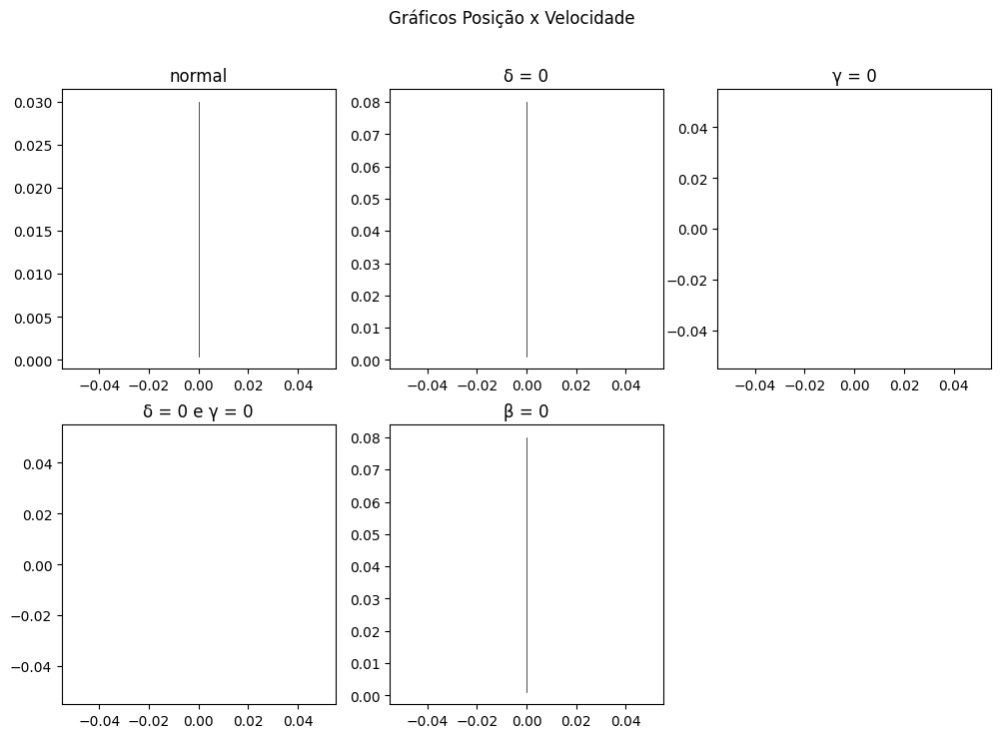

In [ ]:
delta = 0.02
alpha = -1
beta = 5
gamma = 8
omega = 1

mosaico = """
          abc
          de.
          """

fig = plt.figure(figsize=(12, 8))
ax = fig.subplot_mosaic(mosaico)
fig.suptitle("Gráficos Posição x Velocidade")

Dados = geraDados(x0, t, delta, alpha, beta, 0, omega)
Dados = A@Dados.T[:, :-1]

titulo = "γ = 0"
ax['c'].plot(Dados[:, 0], Dados[:, 1], linewidth=0.5, color="black")
ax['c'].set_title(titulo)

Dados = geraDados(x0, t, 0, alpha, beta, gamma, omega)
Dados = A@Dados.T[:, :-1]

titulo = "δ = 0"
ax['b'].plot(Dados[:, 0], Dados[:, 1], linewidth=0.5, color="black")
ax['b'].set_title(titulo)


Dados = geraDados(x0, t)
Dados = A@Dados.T[:, :-1]

titulo = "normal"
ax['a'].plot(Dados[:, 0], Dados[:, 1], linewidth=0.5, color="black")
ax['a'].set_title(titulo)

Dados = geraDados(x0, t, 0, alpha, beta, 0, omega)
Dados = A@Dados.T[:, :-1]

titulo = "δ = 0 e γ = 0"
ax['d'].plot(Dados[:, 0], Dados[:, 1], linewidth=0.5, color="black")
ax['d'].set_title(titulo)


Dados = geraDados(x0, t, delta, alpha, 0, gamma, omega)
Dados = A@Dados.T[:, :-1]

titulo = "β = 0"
ax['e'].plot(Dados[:, 0], Dados[:, 1], linewidth=0.5, color="black")
ax['e'].set_title(titulo)

---

#Rápido comentário do teorema de Π.

Confesso que não compreendi bem a aplicação dele no exemplo em que vi, mas seu uso se deu assim:

###$τ = t\sqrt{a}, y = \frac{xα}{γ}$

Assim a equação poderia ser reescrita como:

###$\frac{d^{2}y}{dτ^{2}} + 2η\frac{dy}{d\tau} + y + ϵy^{3} = cos(στ)$, onde $η = \frac{δ}{2\sqrt{a}}$, $ϵ = \frac{βγ^{2}}{α^{3}}$, $σ = \frac{ω}{\sqrt{α}}$.

Sendo sincero, não me pareceu ajudar muito, continua com 4 parâmetros. Mas certamente teria de estudar isso mais a fundo.

---

#Considerações finais

Pelo modelo de Duffing ser um modelo de sistemas harmônicos, DMD pareceu ser uma boa forma de aproximar os dados desse sistema, porém a parte imaginária me deixou um pouco em dúvida em como lidar com o resultado obtido.

#Referências:

https://docs.scipy.org/doc/scipy/reference/generated/scipy.integrate.odeint.html [1]

https://www.monografias.ufop.br/bitstream/35400000/1343/1/MONOGRAFIA_EquaçãoDuffingAplicada.pdf [2]

https://www.sofisica.com.br/conteudos/Ondulatoria/MHS/forcanomhs.php [3]

https://en.wikipedia.org/wiki/Duffing_equation [4]


*Certamente faltou um link ou outro, portanto peço desculpas.